In [ ]:
# prompt: drive

from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa (the mother of audio files)
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')

##Classes

In [ ]:
import os

# Update the path to point to your directory
general_path = '/content/gdrive/MyDrive/audio classification'

# List the contents of the directory
print(list(os.listdir(general_path)))


['Gataberaya', 'Flue']


##Basic Statisrics

In [ ]:
import librosa
import numpy as np

# Define the new file path
new_audio_path = '/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav'

# Importing the new file
y, sr = librosa.load(new_audio_path)

# Print the audio signal and its properties
print('y : Amplitude Values :', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (Hz):', sr, '\n')

# Verify the length of the audio
print('duration in seconds:', len(y) / sr)


y : Amplitude Values : [-0.00057834 -0.00099431 -0.00110049 ...  0.          0.
  0.        ] 

y shape: (46242,) 

Sample Rate (Hz): 22050 

duration in seconds: 2.097142857142857


In [ ]:
ipd.Audio(data=y, rate=sr)

In [ ]:
import os

# Directory containing audio files
directory = '/content/gdrive/MyDrive/audio classification'

# List all classes (subdirectories)
classes = os.listdir(directory)
print("Classes:", classes)


Classes: ['Gataberaya', 'Flue']


## Amplitude values and shape of Gataberaya and Flute class

In [ ]:

# Dictionary to hold audio files for each class
audio_data = {}

# Loop through each class and load audio files
for class_name in classes:
    class_dir = os.path.join(directory, class_name)
    # List audio files in the class directory
    files = os.listdir(class_dir)
    # Load audio files and store them in the dictionary
    audio_data[class_name] = [librosa.load(os.path.join(class_dir, file))[0] for file in files]

# Print the first few audio files for each class
for class_name, files in audio_data.items():
    print(f"Class: {class_name}")
    for i, file in enumerate(files[:3]):
        print(f"Audio {i+1}:", file)
        print("Shape:", np.shape(file))


Class: Gataberaya
Audio 1: [-0.00011149  0.00025658  0.00050135 ...  0.          0.
  0.        ]
Shape: (46242,)
Audio 2: [2.5681546e-04 1.8643355e-04 5.0471397e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
Shape: (46242,)
Audio 3: [-6.3907355e-05 -5.5905432e-05 -6.3151121e-05 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00]
Shape: (46242,)
Class: Flue
Audio 1: [ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -3.1600706e-05
 -2.3544952e-04 -8.3576090e-04]
Shape: (46243,)
Audio 2: [-0.0025614  -0.00546885 -0.00479539 ...  0.          0.
  0.        ]
Shape: (46242,)
Audio 3: [-0.00308247 -0.00523996 -0.00586862 ...  0.          0.
  0.        ]
Shape: (46242,)


#2D Representation: Sound Waves¶


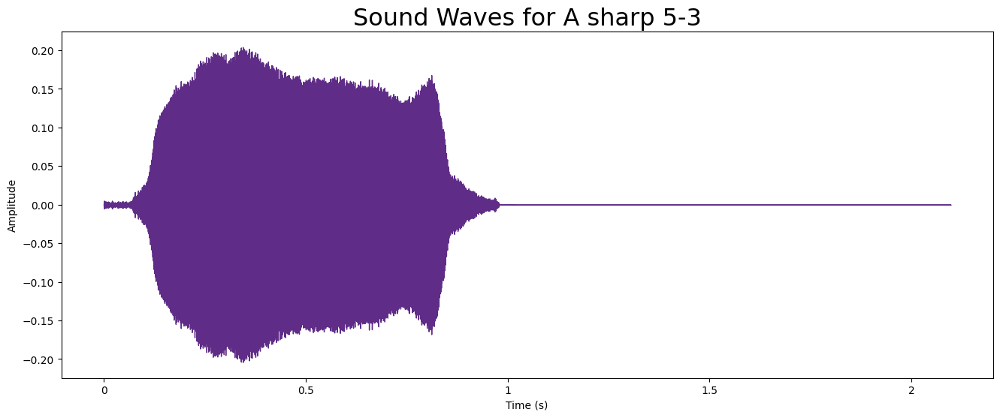

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Define the file path
audio_file_path = '/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav'

# Load the audio file
y, sr = librosa.load(audio_file_path)

# Plot the sound wave
plt.figure(figsize=(16, 6))
librosa.display.waveshow(y=y, sr=sr, color="#5F2D87")
plt.title("Sound Waves for A sharp 5-3", fontsize=23)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


In [ ]:
pip install playsound


  Preparing metadata (setup.py) ... done
  Created wheel for playsound: filename=playsound-1.3.0-py3-none-any.whl size=7020 sha256=639a8ab306bc2eeabb3a678be0580633476fa1bffcfdd6b4b17399e3d337fc12
  Stored in directory: /root/.cache/pip/wheels/90/89/ed/2d643f4226fc8c7c9156fc28abd8051e2d2c0de37ae51ac45c
Successfully built playsound


In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.fft import fft, fftfreq
import scipy.io.wavfile as wav
import json
from playsound import playsound


In [ ]:

DURATION = 2.1  # Seconds
wav_file = open(audio_file_path, "rb")
SAMPLE_RATE, data = wav.read(wav_file)

In [ ]:
from IPython.display import Audio
wn = Audio(audio_file_path, autoplay=True)
display(wn)

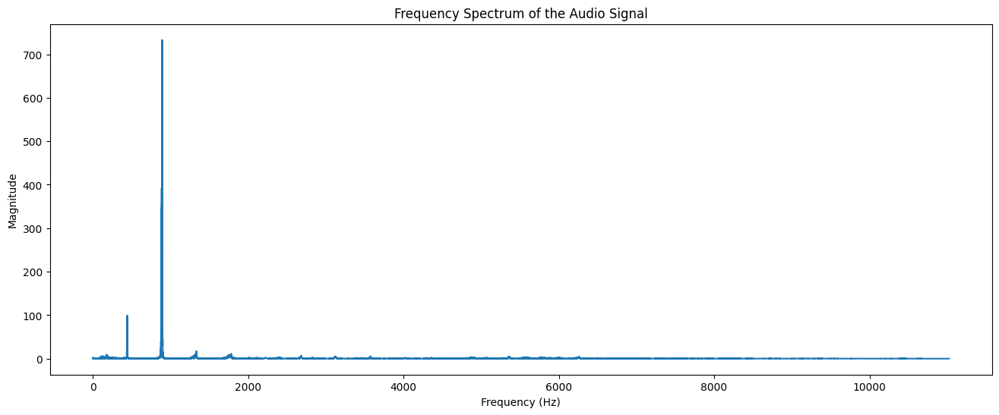

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa  # Assuming you're working with audio data
import librosa.display

# Apply the Fast Fourier Transform (FFT)
# This returns complex values; we take the absolute value to get the magnitude
Y = np.fft.fft(y)

# Get the frequencies corresponding to the FFT components
frequencies = np.fft.fftfreq(len(Y), 1/sr)

# We only need the first half of the FFT output (positive frequencies)
positive_frequencies = frequencies[:len(frequencies)//2]
positive_magnitudes = np.abs(Y)[:len(Y)//2]

# Plot the frequency spectrum
plt.figure(figsize=(16, 6))
plt.plot(positive_frequencies, positive_magnitudes)
plt.title('Frequency Spectrum of the Audio Signal')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.show()


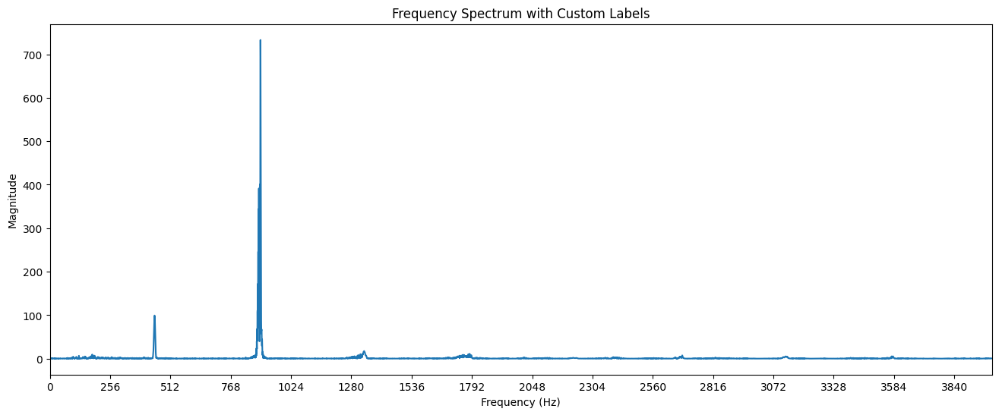

In [ ]:


# Apply the Fast Fourier Transform (FFT)
Y = np.fft.fft(y)

# Get the frequencies corresponding to the FFT components
frequencies = np.fft.fftfreq(len(Y), 1/sr)

# Get the positive frequencies and magnitudes
positive_frequencies = frequencies[:len(frequencies) // 2]
positive_magnitudes = np.abs(Y)[:len(Y) // 2]

# Create a plot with custom frequency axis labels
plt.figure(figsize=(16, 6))
plt.plot(positive_frequencies, positive_magnitudes)

# Define the frequency range to plot (from 0 to max positive frequency)
plt.xlim(0, 4000)

# Create tick marks for multiples of 256 Hz
tick_values = np.arange(0, 4000, 256)
plt.xticks(tick_values)  # Set the x-axis ticks at these multiples of 256

plt.title('Frequency Spectrum with Custom Labels')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.show()


#Fourier Transform

Shape of D object: (1025, 91)


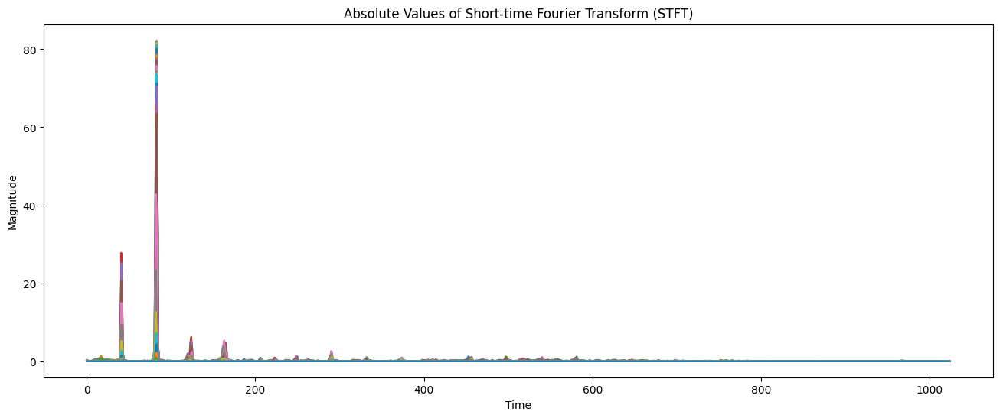

In [ ]:
# Default FFT window size and hop length
n_fft = 2048  # FFT window size
hop_length = 512  # Hop length

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))

print('Shape of D object:', np.shape(D))

# Plot the absolute values of STFT
plt.figure(figsize=(16, 6))
plt.plot(D)
plt.title('Absolute Values of Short-time Fourier Transform (STFT)')
plt.xlabel('Time')
plt.ylabel('Magnitude')
plt.show()


#The Spectrogram

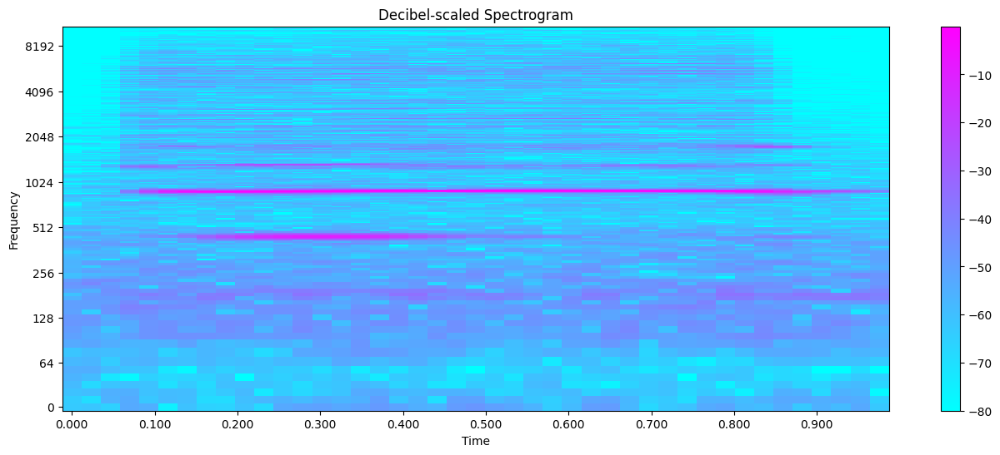

In [ ]:
# Default FFT window size and hop length
n_fft = 2048  # FFT window size
hop_length = 512  # Hop length

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))

# Convert amplitude spectrogram to decibel-scaled spectrogram
DB = librosa.amplitude_to_db(D, ref=np.max)

# Plot the spectrogram
plt.figure(figsize=(16, 6))
librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar()
plt.title('Decibel-scaled Spectrogram')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()


#Mel Spectrogram


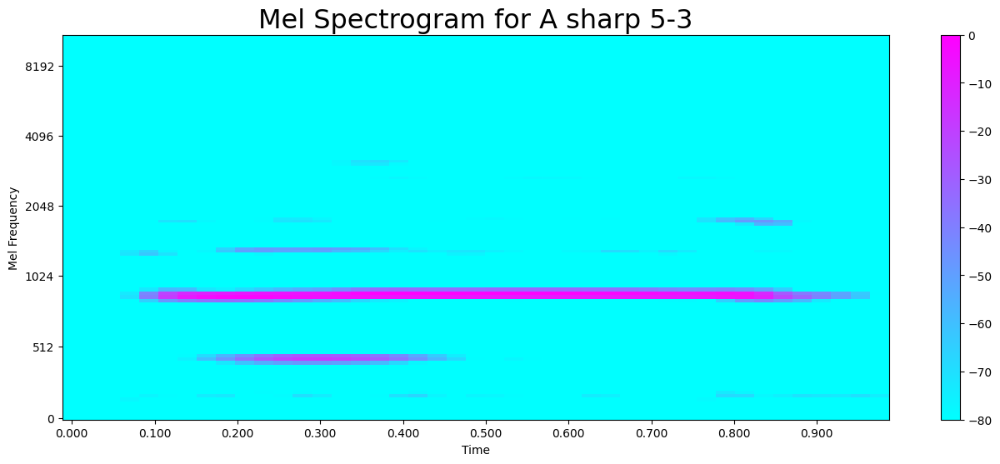

In [ ]:
# Load the audio file and trim silence
y, sr = librosa.load('/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav')
y, _ = librosa.effects.trim(y)

# Define hop length (same as previously used)
hop_length = 512

# Compute the Mel Spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr, hop_length=hop_length)

# Convert amplitude spectrogram to decibel-scaled spectrogram
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Plot the Mel Spectrogram
plt.figure(figsize=(16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', cmap='cool')
plt.colorbar()
plt.title("Mel Spectrogram for A sharp 5-3", fontsize=23)
plt.xlabel("Time")
plt.ylabel("Mel Frequency")
plt.show()


##*Audio* *Features*

#Zero Crossing Rate

In [ ]:
# Load the audio file
y, sr = librosa.load('/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav')

# Compute zero crossings
zero_crossings = librosa.zero_crossings(y, pad=False)

# Print the total number of zero crossings
print("Total number of zero crossings:", sum(zero_crossings))


Total number of zero crossings: 1782


# Harmonics and Perceptrual


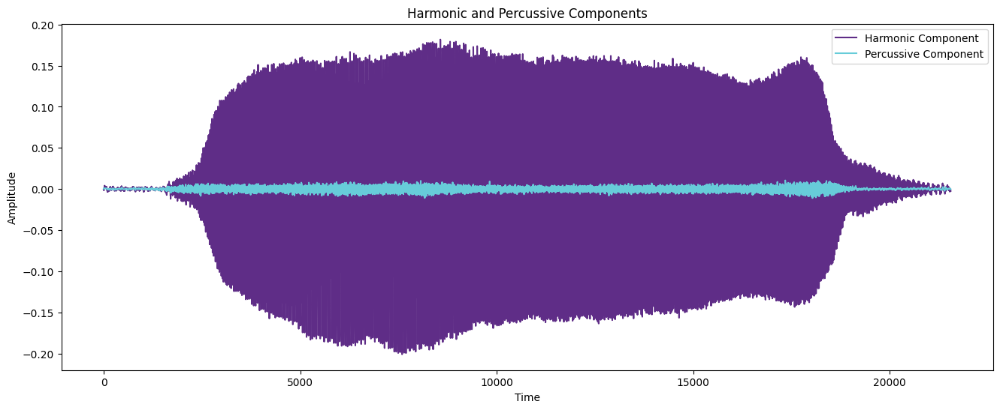

In [ ]:
# Load the audio file
y, sr = librosa.load('/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav')

# Separate harmonic and percussive components
y_harm, y_perc = librosa.effects.hpss(y)

# Plot harmonic and percussive components
plt.figure(figsize=(16, 6))
plt.plot(y_harm, color='#5F2D87', label='Harmonic Component')
plt.plot(y_perc, color='#67CCD9', label='Percussive Component')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Harmonic and Percussive Components')
plt.legend()
plt.show()


#Tempo BMP (beats per minute)

In [ ]:
# Load the audio file
y, sr = librosa.load('/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav')

# Compute beat tempo
tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

# Print the tempo
print("Estimated Tempo:", tempo)


Estimated Tempo: 86.1328125


#Spectral Centroid

In [ ]:
# Calculate the Spectral Centroids
spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]

# Shape is a vector
print('Centroids:', spectral_centroids, '\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)


Centroids: [1544.78890556 1673.80503858 2214.87758951 3029.19402172 3040.59778355
 2678.68764696 2262.99803369 2130.57869092 2002.85359765 1910.26448242
 1868.12778657 1769.70119754 1750.5062706  1814.42288795 1902.28951309
 2009.72209658 2137.37192116 2141.58949221 2093.65773613 2152.53889217
 2207.72846258 2239.44849398 2222.42180641 2218.14180799 2205.55006821
 2244.19568349 2216.2476649  2269.83107564 2274.47419477 2232.9770586
 2252.21324798 2244.81672315 2280.84701304 2308.73468736 2212.99701266
 1958.96991734 1707.43656854 1447.07893723 1292.6968769  1349.08406584
 1523.68272425 1546.77554922 1536.69856462] 

Shape of Spectral Centroids: (43,) 

frames: range(0, 43) 

t: [0.         0.02321995 0.04643991 0.06965986 0.09287982 0.11609977
 0.13931973 0.16253968 0.18575964 0.20897959 0.23219955 0.2554195
 0.27863946 0.30185941 0.32507937 0.34829932 0.37151927 0.39473923
 0.41795918 0.44117914 0.46439909 0.48761905 0.510839   0.53405896
 0.55727891 0.58049887 0.60371882 0.62693878 0

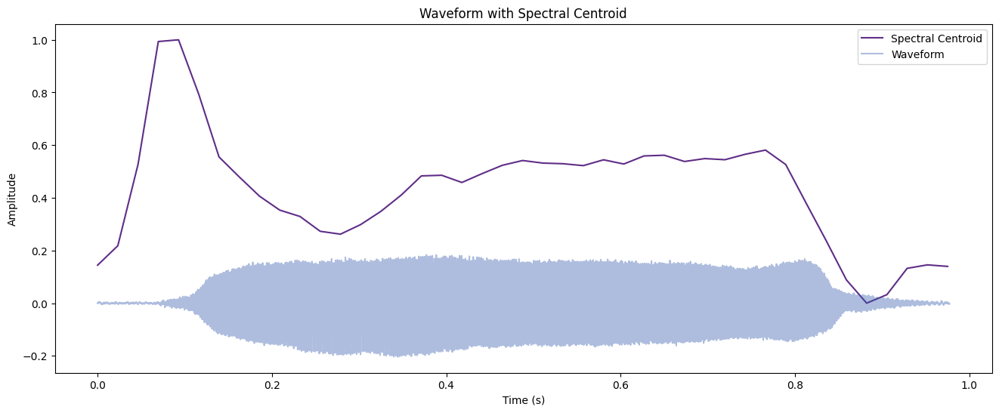

In [ ]:
# Plotting the Spectral Centroid along the waveform
plt.figure(figsize=(16, 6))
plt.plot(t, normalize(spectral_centroids), color='#5F2D87', label='Spectral Centroid')
plt.plot(np.linspace(0, len(y) / sr, len(y)), y, color='#355BAE', label='Waveform', alpha=0.4)
plt.title('Waveform with Spectral Centroid')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


#Spectral Rolloff

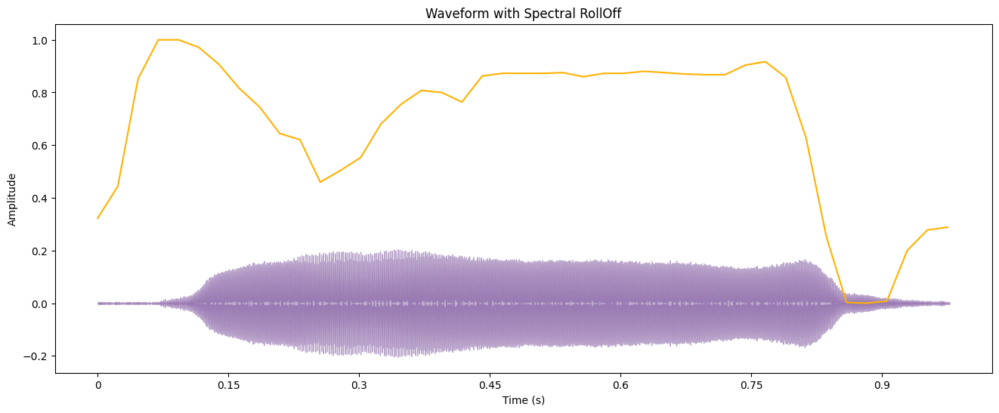

In [ ]:
# Calculate the Spectral RollOff Vector
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]

# Computing the time variable for visualization
frames = range(len(spectral_rolloff))
t = librosa.frames_to_time(frames)

# Normalising the spectral rolloff for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Plotting the Spectral RollOff along the waveform
plt.figure(figsize=(16, 6))
librosa.display.waveshow(y, sr=sr, alpha=0.4, color='#5F2D87')
plt.plot(t, normalize(spectral_rolloff), color='#FFB100')
plt.title('Waveform with Spectral RollOff')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


#Mel-Frequency Cepstral Coefficients

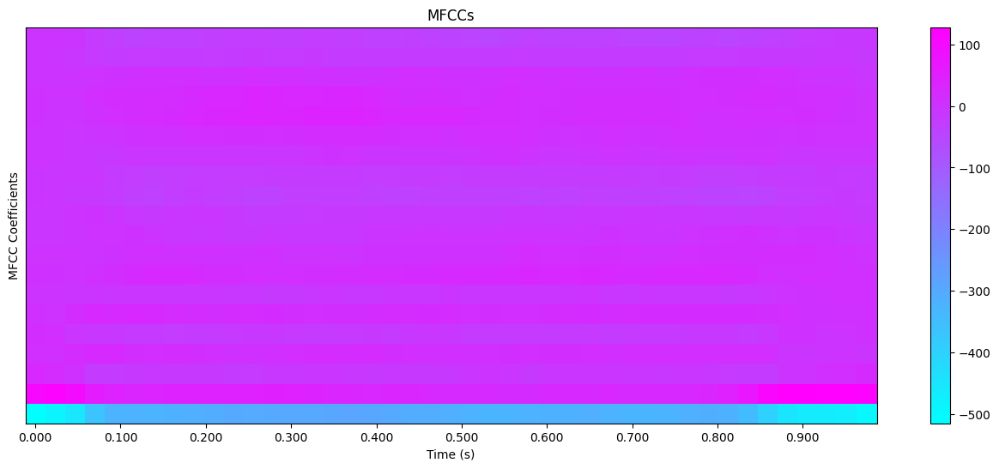

MFCCs shape: (20, 43)


In [ ]:
# Load the audio file
y, sr = librosa.load('/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav')

# Calculate the MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr)

# Display the MFCCs
plt.figure(figsize=(16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='cool')
plt.colorbar()
plt.title('MFCCs')
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.show()

# Print the shape of MFCCs
print('MFCCs shape:', mfccs.shape)


## Scaled mel frequency cepstral coefficients

Mean: 1.1089236e-09
Variance: 1.0


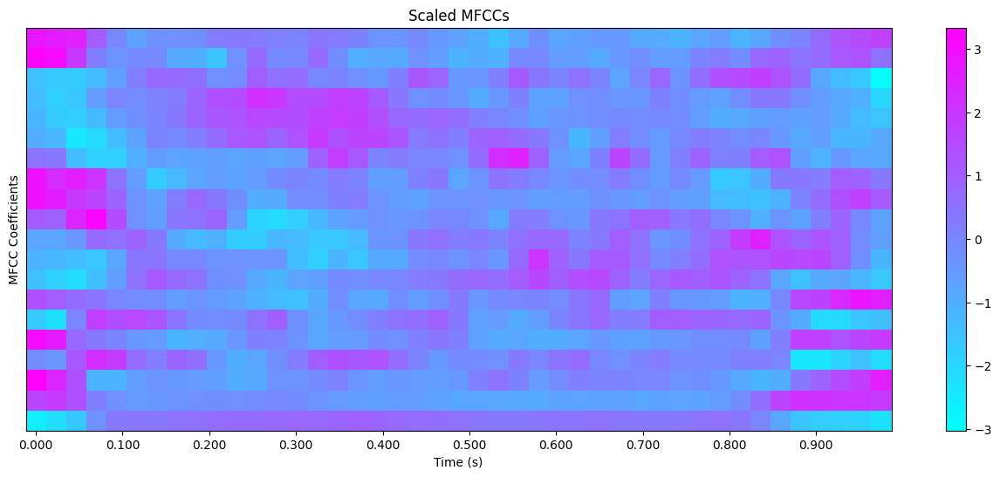

In [ ]:
# Perform Feature Scaling
mfccs_scaled = sklearn.preprocessing.scale(mfccs, axis=1)

# Print mean and variance after scaling
print('Mean:', mfccs_scaled.mean())
print('Variance:', mfccs_scaled.var())

# Display the scaled MFCCs
plt.figure(figsize=(16, 6))
librosa.display.specshow(mfccs_scaled, sr=sr, x_axis='time', cmap='cool')
plt.colorbar()
plt.title('Scaled MFCCs')
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.show()


#Chroma Frequencies

Chromogram shape: (12, 5)


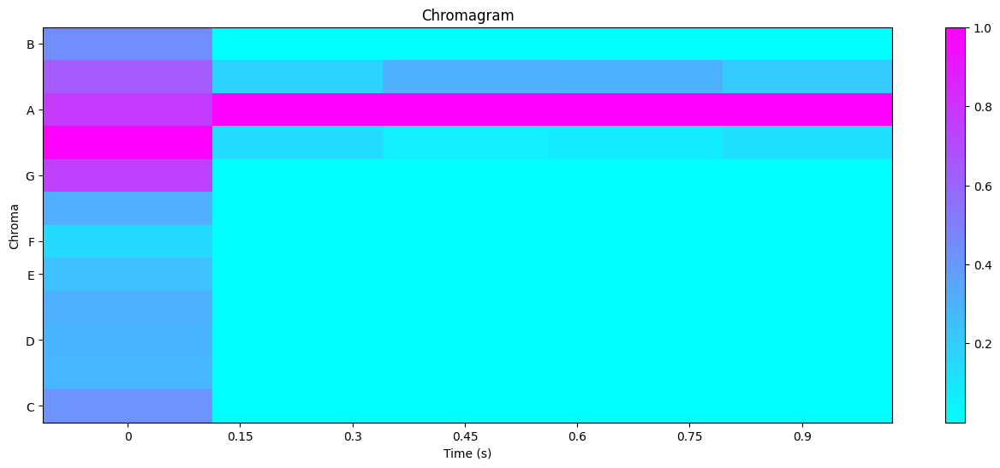

In [ ]:
# Load the audio file
y, sr = librosa.load('/content/gdrive/MyDrive/audio classification/Flue/A sharp 5-3.wav')

# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000

# Chromogram
chromagram = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)
print('Chromogram shape:', chromagram.shape)

# Plot the chromagram
plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='cool')
plt.colorbar()
plt.title('Chromagram')
plt.xlabel('Time (s)')
plt.ylabel('Chroma')
plt.show()


#EDA

##Class Label in a Dataframe

In [ ]:
import os
import pandas as pd

# Path to the directory containing the classes
base_path = '/content/gdrive/MyDrive/audio classification'

# List of classes
classes = os.listdir(base_path)

# Initialize an empty list to store data for each file
data = []

# Traverse through each class
for class_name in classes:
    class_path = os.path.join(base_path, class_name)
    # List all WAV files in the class directory
    wav_files = [file for file in os.listdir(class_path) if file.endswith('.wav')]
    # Create a DataFrame for the class
    class_df = pd.DataFrame({'file_path': [os.path.join(class_path, file) for file in wav_files],
                             'class_label': [class_name] * len(wav_files)})
    # Append the DataFrame to the list
    data.append(class_df)

# Concatenate the DataFrames for each class into one DataFrame
df = pd.concat(data, ignore_index=True)

# Display the DataFrame
display(df.head())
display(df.tail())



,file_path,class_label
0,/content/gdrive/MyDrive/audio classification/G...,Gataberaya
1,/content/gdrive/MyDrive/audio classification/G...,Gataberaya
2,/content/gdrive/MyDrive/audio classification/G...,Gataberaya
3,/content/gdrive/MyDrive/audio classification/G...,Gataberaya
4,/content/gdrive/MyDrive/audio classification/G...,Gataberaya


,file_path,class_label
311,/content/gdrive/MyDrive/audio classification/F...,Flue
312,/content/gdrive/MyDrive/audio classification/F...,Flue
313,/content/gdrive/MyDrive/audio classification/F...,Flue
314,/content/gdrive/MyDrive/audio classification/F...,Flue
315,/content/gdrive/MyDrive/audio classification/F...,Flue


##Count of each class

In [ ]:
# Get the count of each class
class_counts = df['class_label'].value_counts()

# Print the count of each class
print("Class Counts:")
print(class_counts)


Class Counts:
class_label
Flue          171
Gataberaya    145
Name: count, dtype: int64


#Visualizing Distribution of Classes

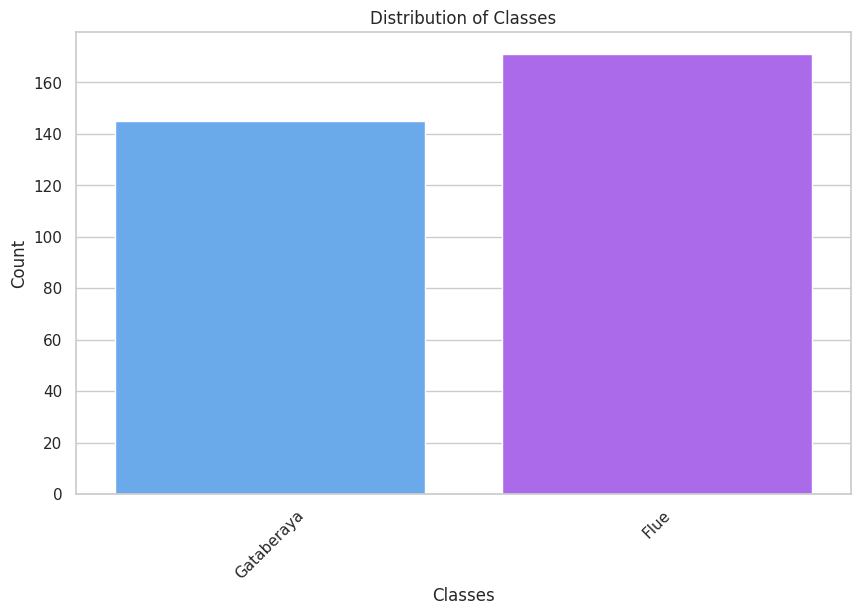

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the seaborn plots
sns.set(style="whitegrid")

# Create the count plot with "cool" color palette
plt.figure(figsize=(10, 6))
sns.countplot(x='class_label', data=df, palette='cool')
plt.title('Distribution of Classes')
plt.xlabel('Classes')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


##Basic stats of audio Files

In [ ]:
import os
import librosa
import numpy as np
import pandas as pd

# Function to calculate basic statistics for audio files
def calculate_basic_stats(audio_dir):
    file_stats = []

    for root, dirs, files in os.walk(audio_dir):
        for file in files:
            if file.endswith('.wav'):
                file_path = os.path.join(root, file)
                class_label = os.path.basename(root)

                # Load audio file
                audio_data, sr = librosa.load(file_path, sr=None)

                # Calculate duration
                duration = librosa.get_duration(y=audio_data, sr=sr)

                # Calculate amplitude distribution
                amplitude_mean = np.mean(np.abs(audio_data))
                amplitude_std = np.std(np.abs(audio_data))
                amplitude_max = np.max(np.abs(audio_data))
                amplitude_min = np.min(np.abs(audio_data))

                # Append stats to list
                file_stats.append({
                    'File': file,
                    'Class': class_label,
                    'Duration (s)': duration,
                    'Sampling Rate (Hz)': sr,
                    'Amplitude Mean': amplitude_mean,
                    'Amplitude Std': amplitude_std,
                    'Amplitude Max': amplitude_max,
                    'Amplitude Min': amplitude_min
                })

    return pd.DataFrame(file_stats)

# Provide path to the directory containing audio files
audio_directory = "/content/gdrive/MyDrive/audio classification"

# Calculate basic statistics
basic_stats_df = calculate_basic_stats(audio_directory)

# Display the table
print(basic_stats_df)


                File       Class  Duration (s)  Sampling Rate (Hz)  \
0       dom1 -1 .wav  Gataberaya      0.944444               44100   
1       dom1 - 2.wav  Gataberaya      0.862336               44100   
2        dom1 -3.wav  Gataberaya      0.848095               44100   
3        dom1 -4.wav  Gataberaya      0.876599               44100   
4         dom1-5.wav  Gataberaya      0.836531               44100   
..               ...         ...           ...                 ...   
311  D sharp 6-4.wav        Flue      0.974354               44100   
312        E 6-5.wav        Flue      0.950590               44100   
313        F 6-5.wav        Flue      0.926825               44100   
314  F sharp 6-5.wav        Flue      1.045646               44100   
315        G 6-4.wav        Flue      0.950590               44100   

     Amplitude Mean  Amplitude Std  Amplitude Max  Amplitude Min  
0          0.138683       0.149370       0.519104            0.0  
1          0.148920      

In [ ]:
import os

# Function to extract features (audio file paths) and target labels (class names)
def extract_features_and_labels(base_path):
    X = []  # Features (audio file paths)
    y = []  # Target labels (class names)

    # Traverse through each class
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        # List all WAV files in the class directory
        wav_files = [file for file in os.listdir(class_path) if file.endswith('.wav')]
        # Append audio file paths and corresponding class names to X and y respectively
        X.extend([os.path.join(class_path, file) for file in wav_files])
        y.extend([class_name] * len(wav_files))

    return X, y

# Provide the base path to the directory containing audio files
base_path = '/content/gdrive/MyDrive/audio classification'

# Extract features (audio file paths) and target labels (class names)
X, y = extract_features_and_labels(base_path)

In [ ]:
# Display the first few elements of X and y
print("First few elements of Features (X):", X[:5])
print("First few elements of Target Labels (y):", y[:5])

# Display the last few elements of X and y
print("Last few elements of Features (X):", X[-5:])
print("Last few elements of Target Labels (y):", y[-5:])


First few elements of Features (X): ['/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 -1 .wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 - 2.wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 -3.wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 -4.wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1-5.wav']
First few elements of Target Labels (y): ['Gataberaya', 'Gataberaya', 'Gataberaya', 'Gataberaya', 'Gataberaya']
Last few elements of Features (X): ['/content/gdrive/MyDrive/audio classification/Flue/D sharp 6-4.wav', '/content/gdrive/MyDrive/audio classification/Flue/E 6-5.wav', '/content/gdrive/MyDrive/audio classification/Flue/F 6-5.wav', '/content/gdrive/MyDrive/audio classification/Flue/F sharp 6-5.wav', '/content/gdrive/MyDrive/audio classification/Flue/G 6-4.wav']
Last few elements of Target Labels (y): ['Flue', 'Flue', 'Flue', 'Flue', 'Flue']


In [ ]:
import os

# Function to scan the directory and prepare a list of all the audio file paths
def scan_directory(base_path):
    audio_paths = []  # List to store audio file paths

    # Traverse through each class
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        # List all WAV files in the class directory
        wav_files = [file for file in os.listdir(class_path) if file.endswith('.wav')]
        # Append audio file paths to the list
        audio_paths.extend([os.path.join(class_path, file) for file in wav_files])

    return audio_paths

# Function to extract the class label from each file name or from the name of the parent sub-folder
def extract_class_label(file_path):
    # Extract the class label from the parent folder name
    class_label = os.path.basename(os.path.dirname(file_path))
    return class_label

# Function to map each class name from text to a numeric class ID
def map_class_to_numeric(class_names):
    # Create a dictionary to map class names to numeric IDs
    class_to_id = {class_name: i for i, class_name in enumerate(set(class_names))}
    # Map class names to numeric IDs
    numeric_class_ids = [class_to_id[class_name] for class_name in class_names]
    return numeric_class_ids, class_to_id

# Provide the base path to the directory containing audio files
base_path = '/content/gdrive/MyDrive/audio classification'

# Scan the directory and prepare a list of all the audio file paths
audio_paths = scan_directory(base_path)

# Extract the class label from each file name or from the name of the parent sub-folder
class_labels = [extract_class_label(file_path) for file_path in audio_paths]

# Map each class name from text to a numeric class ID
numeric_class_ids, class_to_id = map_class_to_numeric(class_labels)

# Display the first few audio file paths, class labels, and numeric class IDs
print("First few audio file paths:", audio_paths[:5])
print("First few class labels:", class_labels[:5])
print("First few numeric class IDs:", numeric_class_ids[:5])

# Display the mapping of class names to numeric class IDs
print("Class name to numeric ID mapping:")
for class_name, numeric_id in class_to_id.items():
    print(f"{class_name}: {numeric_id}")


First few audio file paths: ['/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 -1 .wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 - 2.wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 -3.wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1 -4.wav', '/content/gdrive/MyDrive/audio classification/Gataberaya/dom1-5.wav']
First few class labels: ['Gataberaya', 'Gataberaya', 'Gataberaya', 'Gataberaya', 'Gataberaya']
First few numeric class IDs: [1, 1, 1, 1, 1]
Class name to numeric ID mapping:
Flue: 0
Gataberaya: 1


#Audio Pre-processing

checking the channel type

In [ ]:
import librosa

# Load audio file
audio_path = '/content/gdrive/MyDrive/audio classification/Flue/A 4-3.wav'
y, sr = librosa.load(audio_path, sr=None, mono=False)

# Check if the audio has multiple channels
is_stereo = y.ndim > 1

if is_stereo:
    print("The audio file is stereo.")
else:
    print("The audio file is mono.")


The audio file is stereo.


In [ ]:
!pip install pydub


In [ ]:
import os
import librosa
from pydub import AudioSegment

def check_audio_channel(audio_path):
    try:
        # Using librosa
        y, _ = librosa.load(audio_path, sr=None, mono=False)
        is_stereo_librosa = y.ndim > 1

        # Using pydub
        audio = AudioSegment.from_file(audio_path)
        is_stereo_pydub = audio.channels > 1

        return is_stereo_librosa, is_stereo_pydub
    except Exception as e:
        print(f"Error processing {audio_path}: {str(e)}")
        return None, None

def check_directory(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.wav'):
                audio_path = os.path.join(root, file)
                is_stereo_librosa, is_stereo_pydub = check_audio_channel(audio_path)

                if is_stereo_librosa is not None and is_stereo_pydub is not None:
                    print(f"File: {audio_path}")
                    print(f"Librosa stereo: {is_stereo_librosa}")
                    print(f"Pydub stereo: {is_stereo_pydub}\n")

# Check the Flue directory
flue_directory = '/content/gdrive/MyDrive/audio classification/Flue'
check_directory(flue_directory)

# Check the Gataberaya directory
gataberaya_directory = '/content/gdrive/MyDrive/audio classification/Gataberaya'
check_directory(gataberaya_directory)


File: /content/gdrive/MyDrive/audio classification/Flue/C sharp 4 -1 .wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/D 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/D sharp 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/E 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/F 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/F sharp 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/G 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/G sharp 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /content/gdrive/MyDrive/audio classification/Flue/A 4-1.wav
Librosa stereo: True
Pydub stereo: True

File: /cont

check the sampling rate if it's needed to be standadized or not


In [ ]:
import os
import librosa

# Function to scan the directory and prepare a list of all the audio file paths
# Also returns the sample rate of each audio file
def scan_directory_with_sample_rate(base_path):
    audio_paths = []  # List to store audio file paths
    sample_rates = []  # List to store sample rates

    # Traverse through each class
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        # List all WAV files in the class directory
        wav_files = [file for file in os.listdir(class_path) if file.endswith('.wav')]
        # Append audio file paths and sample rates to the lists
        for file in wav_files:
            file_path = os.path.join(class_path, file)
            audio_paths.append(file_path)
            # Load audio file to get sample rate
            audio_data, sr = librosa.load(file_path, sr=None)
            sample_rates.append(sr)

    return audio_paths, sample_rates

# Scan the directory and prepare a list of all the audio file paths
# Also get the sample rate of each audio file
audio_paths, sample_rates = scan_directory_with_sample_rate(base_path)

# Check if all sample rates are 44100
all_44100 = all(sr == 44100 for sr in sample_rates)

if all_44100:
    print("All sample rates are 44100.")
else:
    print("Not all sample rates are 44100.")


All sample rates are 44100.


Check the length

In [ ]:
import librosa

# Function to check if audio samples have the same or different lengths
def check_audio_lengths(audio_paths):
    # Load the first audio file to get its length
    first_audio_data, _ = librosa.load(audio_paths[0], sr=None)
    first_audio_length = len(first_audio_data)

    # Iterate through the remaining audio files and compare their lengths
    for audio_path in audio_paths[1:]:
        audio_data, _ = librosa.load(audio_path, sr=None)
        if len(audio_data) != first_audio_length:
            return False
    return True

# Check if all audio samples have the same lengths
same_lengths = check_audio_lengths(audio_paths)

if same_lengths:
    print("All audio samples have the same length.")
else:
    print("Audio samples have different lengths.")


Audio samples have different lengths.


In [ ]:
import os
import librosa
import random
import torch

class AudioProcessor:
    @staticmethod
    def pad_trunc(aud, max_ms):
        sig, sr = aud
        num_channels, sig_len = sig.shape
        max_len = sr // 1000 * max_ms

        if sig_len > max_len:
            # Truncate the signal to the given length
            sig = sig[:, :max_len]

        elif sig_len < max_len:
            # Length of padding to add at the beginning and end of the signal
            pad_begin_len = random.randint(0, max_len - sig_len)
            pad_end_len = max_len - sig_len - pad_begin_len

            # Pad with zeros
            pad_begin = torch.zeros((num_channels, pad_begin_len))
            pad_end = torch.zeros((num_channels, pad_end_len))

            sig = torch.cat((pad_begin, sig, pad_end), 1)

        return (sig, sr)

# Function to resize all audio samples in the directory
def resize_audio_samples(base_path, max_ms):
    audio_processor = AudioProcessor()
    resized_audio_samples = []

    # Traverse through each class
    for class_name in os.listdir(base_path):
        class_path = os.path.join(base_path, class_name)
        # List all WAV files in the class directory
        wav_files = [file for file in os.listdir(class_path) if file.endswith('.wav')]
        # Iterate through audio files in the class directory
        for file in wav_files:
            file_path = os.path.join(class_path, file)
            # Load audio file
            audio_data, sr = librosa.load(file_path, sr=None, mono=False)
            # Resize audio sample
            resized_audio, sr = audio_processor.pad_trunc((torch.tensor(audio_data), sr), max_ms)
            # Get the length of the resized audio sample
            length = resized_audio.shape[1]
            # Append resized audio sample, class name, and length to the list
            resized_audio_samples.append((resized_audio, class_name, length))

    return resized_audio_samples

# Maximum length in milliseconds
max_ms = 5000

# Resize all audio samples
resized_audio_samples = resize_audio_samples(base_path, max_ms)

# Display the number of resized audio samples
print("Number of resized audio samples:", len(resized_audio_samples))

# Display the length of each resized audio sample
for i, (resized_audio, class_name, length) in enumerate(resized_audio_samples[:5]):
    print(f"Sample {i+1}: Class: {class_name}, Length: {length}")


Number of resized audio samples: 316
Sample 1: Class: Gataberaya, Length: 220000
Sample 2: Class: Gataberaya, Length: 220000
Sample 3: Class: Gataberaya, Length: 220000
Sample 4: Class: Gataberaya, Length: 220000
Sample 5: Class: Gataberaya, Length: 220000


In [ ]:
# Check if all audio samples have the same lengths
def check_audio_lengths(resized_audio_samples):
    # Get the length of the first audio sample
    first_length = resized_audio_samples[0][2]

    # Iterate through the remaining audio samples and compare their lengths
    for _, _, length in resized_audio_samples[1:]:
        if length != first_length:
            return False
    return True

# Check if all audio samples have the same lengths
same_lengths = check_audio_lengths(resized_audio_samples)

if same_lengths:
    print("All audio samples have the same length.")
else:
    print("Audio samples have different lengths.")


All audio samples have the same length.


In [ ]:
if same_lengths:
    print("All audio samples have the same length.")

    # Get the length of the first audio sample (assuming there's at least one sample)
    sample_length = resized_audio_samples[0][2]
    print("Length of the audio sample:", sample_length)
else:
    print("Audio samples have different lengths.")


All audio samples have the same length.
Length of the audio sample: 220000


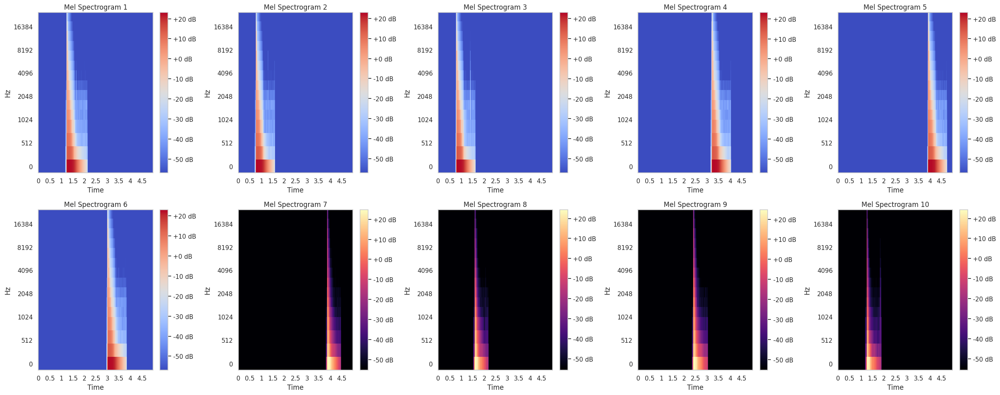

In [ ]:
import librosa.display
import matplotlib.pyplot as plt

# Define parameters for mel spectrogram
n_fft = 2048
hop_length = 512
n_mels = 15

# Function to convert resized stereo audio samples to mel spectrograms
def convert_to_mel_spectrogram(resized_audio_samples):
    mel_spectrograms = []

    for audio_data, _, _ in resized_audio_samples:
        # Compute mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=audio_data.numpy()[0], sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)

        # Convert to decibel scale
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

        # Append to the list
        mel_spectrograms.append(log_mel_spectrogram)

    return mel_spectrograms

# Convert resized audio samples to mel spectrograms
mel_spectrograms = convert_to_mel_spectrogram(resized_audio_samples)

import seaborn as sns

# Display mel spectrograms
plt.figure(figsize=(25, 10))
for i, mel_spec in enumerate(mel_spectrograms[:10]):  # Display first 5 mel spectrograms
    plt.subplot(2, 5, i+1)
    librosa.display.specshow(mel_spec, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram {i+1}')
plt.tight_layout()
plt.show()


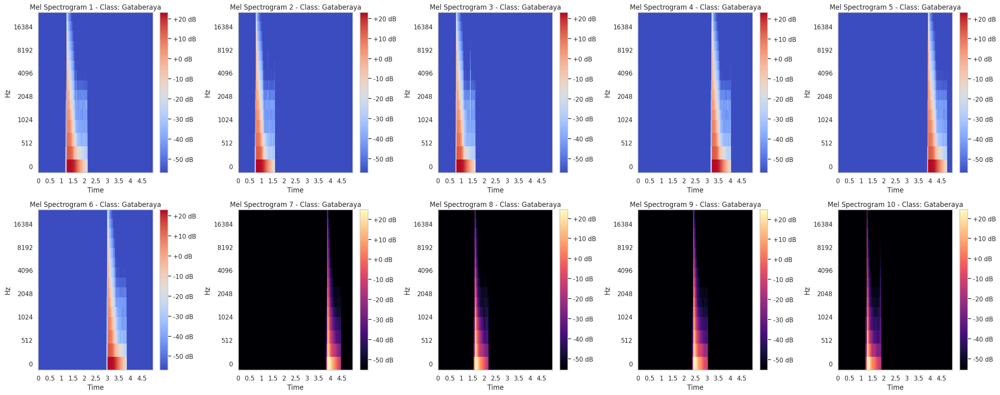

In [ ]:
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns

# Define parameters for mel spectrogram
n_fft = 2048
hop_length = 512
n_mels = 15

# Function to convert resized stereo audio samples to mel spectrograms
def convert_to_mel_spectrogram(resized_audio_samples):
    mel_spectrograms = []
    labels = []

    for audio_data, label, _ in resized_audio_samples:
        # Compute mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=audio_data.numpy()[0], sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)

        # Convert to decibel scale
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

        # Append to the list
        mel_spectrograms.append(log_mel_spectrogram)
        labels.append(label)

    return mel_spectrograms, labels

# Convert resized audio samples to mel spectrograms
mel_spectrograms, labels = convert_to_mel_spectrogram(resized_audio_samples)

# Display mel spectrograms with labels
plt.figure(figsize=(25, 10))
for i, (mel_spec, label) in enumerate(zip(mel_spectrograms[:10], labels[:10])):  # Display first 10 mel spectrograms with labels
    plt.subplot(2, 5, i+1)
    librosa.display.specshow(mel_spec, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram {i+1} - Class: {label}')
plt.tight_layout()
plt.show()


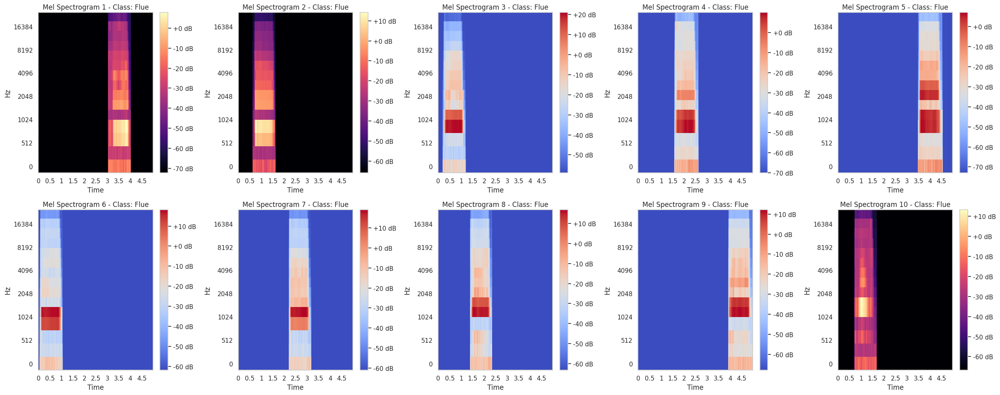

In [ ]:
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns

# Define parameters for mel spectrogram
n_fft = 2048
hop_length = 512
n_mels = 15

# Sample rate (assuming 44100 Hz)
sr = 44100

# Function to convert resized stereo audio samples to mel spectrograms
def convert_to_mel_spectrogram(resized_audio_samples):
    mel_spectrograms = []
    labels = []

    for audio_data, label, _ in resized_audio_samples:
        # Compute mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=audio_data.numpy()[0], sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)

        # Convert to decibel scale
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

        # Append to the list
        mel_spectrograms.append(log_mel_spectrogram)
        labels.append(label)

    return mel_spectrograms, labels

# Convert resized audio samples to mel spectrograms
mel_spectrograms, labels = convert_to_mel_spectrogram(resized_audio_samples)

# Display mel spectrograms with labels
plt.figure(figsize=(25, 10))
for i, (mel_spec, label) in enumerate(zip(mel_spectrograms[-10:], labels[-10:])):  # Display last 10 mel spectrograms with labels
    plt.subplot(2, 5, i+1)
    librosa.display.specshow(mel_spec, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram {i+1} - Class: {label}')
plt.tight_layout()
plt.show()


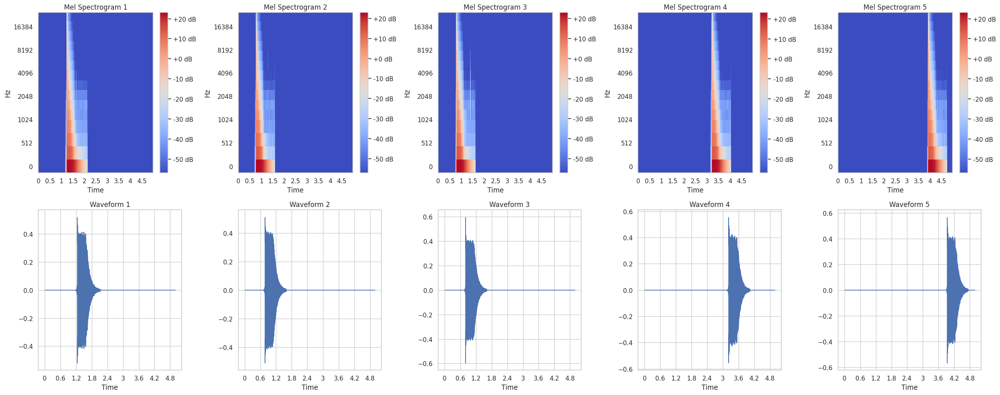

In [ ]:
import librosa.display
import matplotlib.pyplot as plt

# Function to convert resized stereo audio samples to mel spectrograms
def convert_to_mel_spectrogram(resized_audio_samples):
    mel_spectrograms = []
    waveforms = []

    for audio_data, _, _ in resized_audio_samples:
        # Compute mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=audio_data.numpy()[0], sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)

        # Convert to decibel scale
        log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)

        # Append to the list
        mel_spectrograms.append(log_mel_spectrogram)

        # Compute waveform
        waveform = audio_data.numpy()[0]
        waveforms.append(waveform)

    return mel_spectrograms, waveforms

# Convert resized audio samples to mel spectrograms and waveforms
mel_spectrograms, waveforms = convert_to_mel_spectrogram(resized_audio_samples)

# Display mel spectrograms and waveforms
plt.figure(figsize=(25, 10))
for i, (mel_spec, waveform) in enumerate(zip(mel_spectrograms[:5], waveforms[:5])):  # Display first 5 mel spectrograms and waveforms
    plt.subplot(2, 5, i+1)
    librosa.display.specshow(mel_spec, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram {i+1}')

    # Plot waveform
    plt.subplot(2, 5, i+6)
    librosa.display.waveshow(waveform, sr=sr)
    plt.title(f'Waveform {i+1}')

plt.tight_layout()
plt.show()


In [ ]:
import IPython.display as ipd

# Function to reconstruct audio from mel spectrogram
def reconstruct_audio(mel_spectrogram):
    # Convert mel spectrogram to linear scale
    mel_spec_linear = librosa.db_to_power(mel_spectrogram)

    # Invert the mel spectrogram to audio signal
    audio_signal = librosa.feature.inverse.mel_to_audio(mel_spec_linear)

    return audio_signal

# Reconstruct audio and play for the first five mel spectrograms
for i, mel_spec in enumerate(mel_spectrograms[:5], start=1):
    reconstructed_audio = reconstruct_audio(mel_spec)
    print(f"Playing reconstructed audio {i}")
    ipd.display(ipd.Audio(reconstructed_audio, rate=sr))


Playing reconstructed audio 1


Playing reconstructed audio 2


Playing reconstructed audio 3


Playing reconstructed audio 4


Playing reconstructed audio 5


In [ ]:
# Function to reconstruct audio from mel spectrogram
def reconstruct_audio(mel_spectrogram):
    # Convert mel spectrogram to linear scale
    mel_spec_linear = librosa.db_to_power(mel_spectrogram)

    # Invert the mel spectrogram to audio signal
    audio_signal = librosa.feature.inverse.mel_to_audio(mel_spec_linear)

    return audio_signal

# Reconstruct audio from mel spectrogram
reconstructed_audio = reconstruct_audio(mel_spectrograms[0])  # Assuming you want to hear the first spectrogram

# Play the reconstructed audio
import IPython.display as ipd
ipd.Audio(reconstructed_audio, rate=sr)


In [ ]:
print("Label:", class_name)


Label: Gataberaya


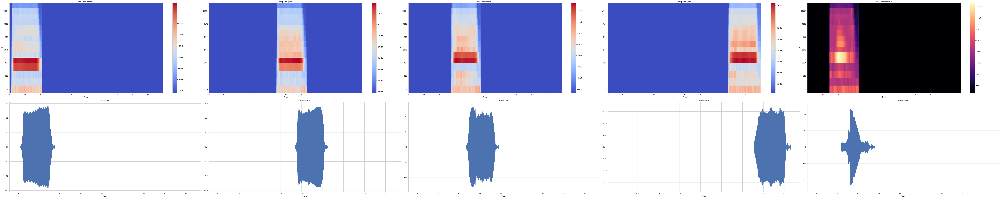

In [ ]:
# Display mel spectrograms and waveforms for the last 5 samples
plt.figure(figsize=(100, 20))
for i, (mel_spec, waveform) in enumerate(zip(mel_spectrograms[-5:], waveforms[-5:]), start=1):  # Display last 5 mel spectrograms and waveforms
    plt.subplot(2, 5, i)
    librosa.display.specshow(mel_spec, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram {i}')

    # Plot waveform
    plt.subplot(2, 5, i+5)
    librosa.display.waveshow(waveform, sr=sr)
    plt.title(f'Waveform {i}')

plt.tight_layout()
plt.show()


In [ ]:
import IPython.display as ipd

# Reconstruct audio and play for every 20th mel spectrogram
for i in range(19, len(mel_spectrograms), 30):
    mel_spec = mel_spectrograms[i]
    reconstructed_audio = reconstruct_audio(mel_spec)
    print(f"Playing reconstructed audio for mel spectrogram {i+1}")
    ipd.display(ipd.Audio(reconstructed_audio, rate=sr))


Playing reconstructed audio for mel spectrogram 20


Playing reconstructed audio for mel spectrogram 50


Playing reconstructed audio for mel spectrogram 80


Playing reconstructed audio for mel spectrogram 110


Playing reconstructed audio for mel spectrogram 140


Playing reconstructed audio for mel spectrogram 170


Playing reconstructed audio for mel spectrogram 200


Playing reconstructed audio for mel spectrogram 230


Playing reconstructed audio for mel spectrogram 260


Playing reconstructed audio for mel spectrogram 290


In [ ]:
import IPython.display as ipd

# Get the file path and label of the last audio file
last_audio_file_path = df.iloc[-1]['file_path']
last_audio_label = df.iloc[-1]['class_label']

# Print the label
print("Label of the last audio file:", last_audio_label)

# Play the original audio corresponding to the last mel spectrogram
print("Playing original audio corresponding to the last mel spectrogram:")
ipd.display(ipd.Audio(last_audio_file_path, rate=sr))


Label of the last audio file: Flue
Playing original audio corresponding to the last mel spectrogram:


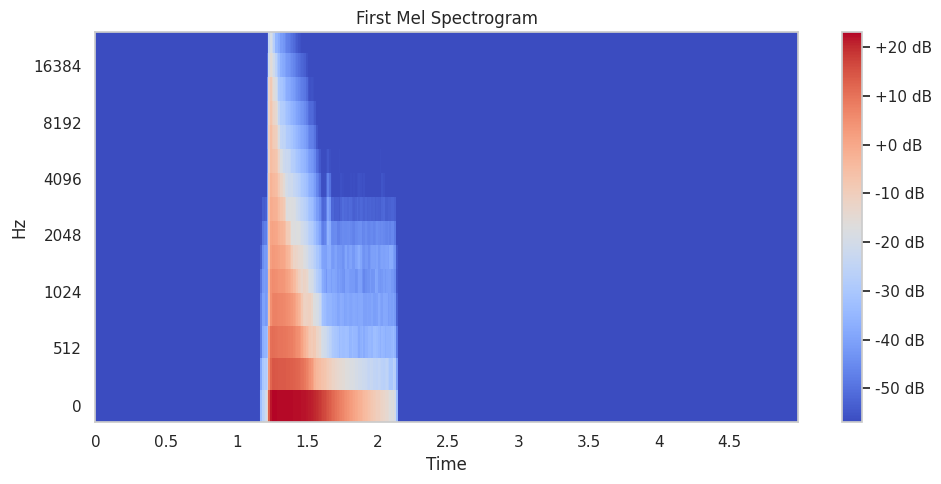

In [ ]:
import librosa.display
import matplotlib.pyplot as plt

# Select the mel spectrogram for the first data point
first_mel_spec = mel_spectrograms[0]

# Plot the first mel spectrogram
plt.figure(figsize=(10, 5))
librosa.display.specshow(first_mel_spec, x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('First Mel Spectrogram')
plt.tight_layout()
plt.show()


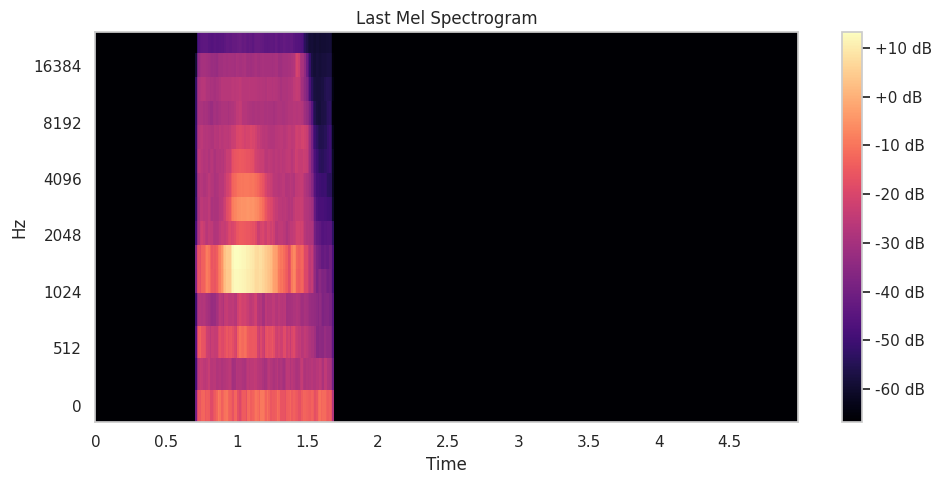

In [ ]:
import librosa.display
import matplotlib.pyplot as plt

# Select the mel spectrogram for the first data point
last_mel_spec = mel_spectrograms[-1]

# Plot the first mel spectrogram
plt.figure(figsize=(10, 5))
librosa.display.specshow(last_mel_spec, x_axis='time', y_axis='mel', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title('Last Mel Spectrogram')
plt.tight_layout()
plt.show()


In [ ]:
import IPython.display as ipd

# Get the file path and label of the last audio file
first_audio_file_path = df.iloc[0]['file_path']
first_audio_label = df.iloc[0]['class_label']

# Print the label
print("Label of the First audio file:", first_audio_label)

# Play the original audio corresponding to the last mel spectrogram
print("Playing original audio corresponding to the first mel spectrogram:")
ipd.display(ipd.Audio(first_audio_file_path, rate=sr))


Label of the First audio file: Gataberaya
Playing original audio corresponding to the first mel spectrogram:
